In [ ]:
import pandas as pd
import numpy as np
import matplotlib
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder,OneHotEncoder,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Тренировка/heart.csv')
df

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,Yes,27.41,Yes,No,No,7.0,0.0,Yes,Male,60-64,Hispanic,Yes,No,Fair,6.0,Yes,No,No
319791,No,29.84,Yes,No,No,0.0,0.0,No,Male,35-39,Hispanic,No,Yes,Very good,5.0,Yes,No,No
319792,No,24.24,No,No,No,0.0,0.0,No,Female,45-49,Hispanic,No,Yes,Good,6.0,No,No,No
319793,No,32.81,No,No,No,0.0,0.0,No,Female,25-29,Hispanic,No,No,Good,12.0,No,No,No


In [ ]:
def reduce_mem_usage(df):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('category')

    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

In [ ]:
df = reduce_mem_usage(df)

Memory usage of dataframe is 43.92 MB
Memory usage after optimization is: 9.15 MB
Decreased by 79.2%


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype   
---  ------            --------------   -----   
 0   HeartDisease      319795 non-null  category
 1   BMI               319795 non-null  float32 
 2   Smoking           319795 non-null  category
 3   AlcoholDrinking   319795 non-null  category
 4   Stroke            319795 non-null  category
 5   PhysicalHealth    319795 non-null  float32 
 6   MentalHealth      319795 non-null  float32 
 7   DiffWalking       319795 non-null  category
 8   Sex               319795 non-null  category
 9   AgeCategory       319795 non-null  category
 10  Race              319795 non-null  category
 11  Diabetic          319795 non-null  category
 12  PhysicalActivity  319795 non-null  category
 13  GenHealth         319795 non-null  category
 14  SleepTime         319795 non-null  float32 
 15  Asthma            319795 non-null  category
 16  Ki

In [ ]:
df.isna().sum()

HeartDisease        0
BMI                 0
Smoking             0
AlcoholDrinking     0
Stroke              0
PhysicalHealth      0
MentalHealth        0
DiffWalking         0
Sex                 0
AgeCategory         0
Race                0
Diabetic            0
PhysicalActivity    0
GenHealth           0
SleepTime           0
Asthma              0
KidneyDisease       0
SkinCancer          0
dtype: int64

In [ ]:
# посмотрим распределение целевой переменной
df["HeartDisease"].value_counts()

No     292422
Yes     27373
Name: HeartDisease, dtype: int64

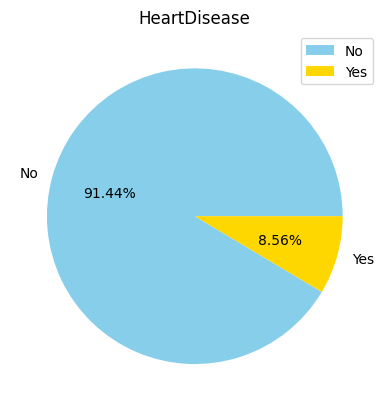

In [ ]:
labels = df['HeartDisease'].value_counts().index
size = df['HeartDisease'].value_counts().values
plt.pie(size,colors= ['skyblue', 'gold'], labels = labels,autopct = "%.2f%%")
plt.title('HeartDisease')
plt.legend()

In [ ]:
df.nunique()

HeartDisease           2
BMI                 3604
Smoking                2
AlcoholDrinking        2
Stroke                 2
PhysicalHealth        31
MentalHealth          31
DiffWalking            2
Sex                    2
AgeCategory           13
Race                   6
Diabetic               4
PhysicalActivity       2
GenHealth              5
SleepTime             24
Asthma                 2
KidneyDisease          2
SkinCancer             2
dtype: int64

In [ ]:
df.describe()

,BMI,PhysicalHealth,MentalHealth,SleepTime
count,319795.000000,319795.00000,319795.000000,319795.000000
mean,28.325396,3.37171,3.898366,7.097075
std,6.356100,7.95085,7.955235,1.436007
min,12.020000,0.00000,0.000000,1.000000
25%,24.030001,0.00000,0.000000,6.000000
50%,27.340000,0.00000,0.000000,7.000000
75%,31.420000,2.00000,3.000000,8.000000
max,94.849998,30.00000,30.000000,24.000000


In [ ]:
!pip install -U dataprep

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 39.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 20.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 18.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 27.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 763.4/763.4 KB 16.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 71.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 KB 17.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 66.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.8/158.8 KB 21.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 KB 28.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.2/114.2 KB 16.

In [ ]:
from dataprep.eda import *


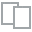
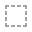
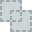
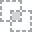
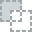
...
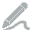
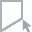
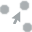
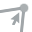
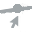

In [ ]:
plot(df)

In [ ]:
df

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.600000,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.340000,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.580000,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.209999,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.709999,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,Yes,27.410000,Yes,No,No,7.0,0.0,Yes,Male,60-64,Hispanic,Yes,No,Fair,6.0,Yes,No,No
319791,No,29.840000,Yes,No,No,0.0,0.0,No,Male,35-39,Hispanic,No,Yes,Very good,5.0,Yes,No,No
319792,No,24.240000,No,No,No,0.0,0.0,No,Female,45-49,Hispanic,No,Yes,Good,6.0,No,No,No
319793,No,32.810001,No,No,No,0.0,0.0,No,Female,25-29,Hispanic,No,No,Good,12.0,No,No,No



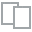
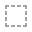
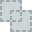
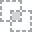
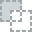
...
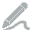
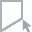
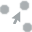
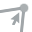
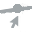

In [ ]:
#проверка некоторых столбцов на взаимосвязь с целевой переменной
plot(df, 'Smoking', 'HeartDisease')


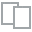
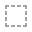
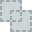
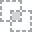
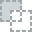
...
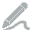
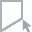
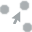
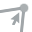
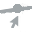

In [ ]:
plot(df, 'AlcoholDrinking', 'HeartDisease')


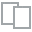
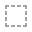
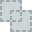
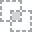
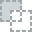
...
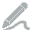
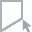
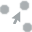
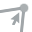
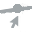

In [ ]:
plot(df, 'AgeCategory', 'HeartDisease')


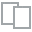
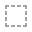
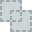
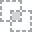
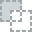
...
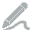
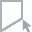
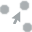
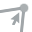
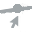

In [ ]:
plot(df, 'Diabetic', 'HeartDisease')

In [ ]:
cat_features = ['HeartDisease',
 'Smoking',
 'AlcoholDrinking',
 'Stroke',
 'DiffWalking',
 'Sex',
 'AgeCategory',
 'Race',
 'Diabetic',
 'PhysicalActivity',
 'GenHealth',
 'Asthma',
 'KidneyDisease',
 'SkinCancer']

In [ ]:
num_features = [ 'BMI',
 'PhysicalHealth',
 'MentalHealth',
 'SleepTime']

In [ ]:
df_1 = df.copy ()

In [ ]:
from sklearn.preprocessing import LabelEncoder,StandardScaler
#для категориальных столбцов - 
le = LabelEncoder()
for feature in cat_features:
    df_1[feature] = le.fit_transform(df_1[feature])

#для числовых - приведение к нормальному распределению
sc = StandardScaler()
for feature in num_features:
    df_1[feature] = sc.fit_transform(np.array(df_1[feature]).reshape(-1,1))

df_1

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,-1.844750,1,0,0,-0.046751,3.281069,0,0,7,5,2,1,4,-1.460354,1,0,1
1,0,-1.256338,0,0,1,-0.424070,-0.490039,0,0,12,5,0,1,4,-0.067601,0,0,0
2,0,-0.274603,1,0,0,2.091388,3.281069,0,1,9,5,2,1,1,0.628776,1,0,0
3,0,-0.647473,0,0,0,-0.424070,-0.490039,0,0,11,5,0,0,2,-0.763977,0,0,1
4,0,-0.726138,0,0,0,3.097572,-0.490039,1,0,4,5,0,1,4,0.628776,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
319790,1,-0.144019,1,0,0,0.456341,-0.490039,1,1,8,3,2,0,1,-0.763977,1,0,0
319791,0,0.238291,1,0,0,-0.424070,-0.490039,0,1,3,3,0,1,4,-1.460354,1,0,0
319792,0,-0.642753,0,0,0,-0.424070,-0.490039,0,0,5,3,0,1,2,-0.763977,0,0,0
319793,0,0.705560,0,0,0,-0.424070,-0.490039,0,0,1,3,0,0,2,3.414282,0,0,0


In [ ]:
X = df_1.drop('HeartDisease', axis=1)
y = df_1['HeartDisease']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=0)


X_train.shape

(239846, 17)

In [ ]:
X_test.shape

(79949, 17)

# Логистическая регрессия


In [ ]:
from sklearn.linear_model import LogisticRegression
lr =LogisticRegression()
lr.fit(X_train, y_train)

LogisticRegression()

In [ ]:
predicted = lr.predict(X_test)
lr.score(X_test, y_test)

0.9149457779334326

In [ ]:
from sklearn.metrics import roc_auc_score
probabilities = lr.predict_proba(X_test)
roc_auc_score(y_test, probabilities[:, 1])

0.8270980184783565

0.8270980184783565

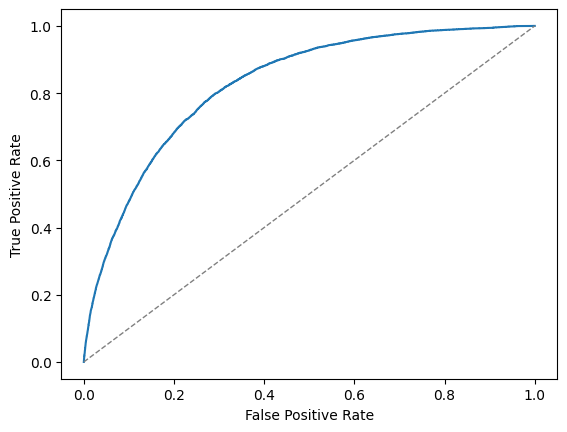

In [ ]:
from sklearn import metrics  
from sklearn.metrics import roc_curve
fpr, tpr, _ = roc_curve(y_test, probabilities[:, 1])
plt.plot(fpr, tpr)
plt.plot([0,1], [0,1], color='grey', lw=1, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
metrics.auc(fpr, tpr)

In [ ]:
from sklearn.metrics import precision_score
train_predictions = lr.predict(X_train)
precision_score(y_train, train_predictions)

0.5239260467645459

In [ ]:
from sklearn.metrics import recall_score
recall_score(y_train, train_predictions)

0.09372112251349643

In [ ]:
from sklearn.metrics import balanced_accuracy_score
balanced_accuracy_score(y_train, train_predictions)

0.5428680401084709

In [ ]:
test_predictions = lr.predict(X_test)
balanced_accuracy_score(y_test, test_predictions)

0.5398203861909876

# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train,y_train)

RandomForestClassifier()

In [ ]:
predicted = rf.predict(X_test)
rf.score(X_test, y_test)

0.9072783899736082

In [ ]:
probabilities = rf.predict_proba(X_test)
roc_auc_score(y_test, probabilities[:, 1])

0.7950637985352195

0.7950637985352195

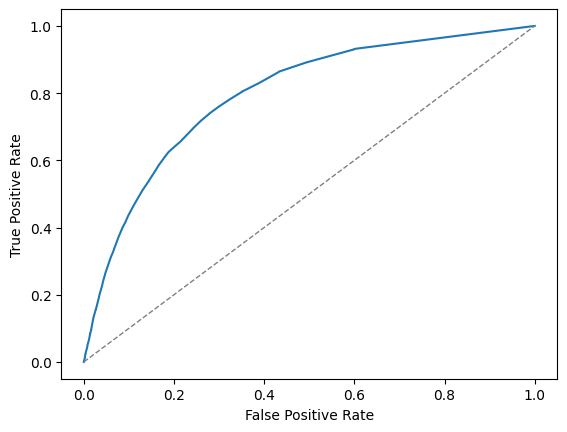

In [ ]:
fpr, tpr, _ = roc_curve(y_test, probabilities[:, 1])
plt.plot(fpr, tpr)
plt.plot([0,1], [0,1], color='grey', lw=1, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
metrics.auc(fpr, tpr)

# PyCaret

In [ ]:
!pip install PyYAML

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install pycaret

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 481.8/481.8 KB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 50.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.0/150.0 KB 20.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 298.0/298.0 KB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 KB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.2/81.2 KB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.2/212.2 KB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 105.8/105.8 KB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.4/46.4 

In [ ]:
from pycaret.classification import *

In [ ]:
data = df.sample(frac=0.10, random_state=786)
data_unseen = df.drop(data.index)
data.reset_index(inplace=True, drop=True)
data_unseen.reset_index(inplace=True, drop=True)
print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (31980, 18)
Unseen Data For Predictions: (287815, 18)


In [ ]:
exp_clf101 =setup(data, target = 'HeartDisease')

,Description,Value
0,Session id,4677
1,Target,HeartDisease
2,Target type,Binary
3,Target mapping,"No: 0, Yes: 1"
4,Original data shape,"(31980, 18)"
5,Transformed data shape,"(31980, 42)"
6,Transformed train set shape,"(22386, 42)"
7,Transformed test set shape,"(9594, 42)"
8,Ordinal features,9
9,Numeric features,4


In [ ]:
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.9136,0.0000,0.0334,0.5517,0.0626,0.0534,0.1187,0.6260
gbc,Gradient Boosting Classifier,0.9135,0.8283,0.0893,0.5195,0.1519,0.1297,0.1883,3.4330
lr,Logistic Regression,0.9133,0.8302,0.0955,0.5122,0.1601,0.1367,0.1927,3.9740
ada,Ada Boost Classifier,0.9131,0.8273,0.1160,0.5006,0.1876,0.1604,0.2099,1.7240
dummy,Dummy Classifier,0.9130,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0780
xgboost,Extreme Gradient Boosting,0.9096,0.8029,0.1073,0.4273,0.1708,0.1408,0.1798,5.5510
knn,K Neighbors Classifier,0.9072,0.6434,0.0555,0.3117,0.0940,0.0696,0.0998,1.7410
lda,Linear Discriminant Analysis,0.9066,0.8245,0.2377,0.4318,0.3053,0.2601,0.2740,0.7120
rf,Random Forest Classifier,0.9059,0.7785,0.0647,0.3090,0.1067,0.0789,0.1069,3.5010
et,Extra Trees Classifier,0.8950,0.7564,0.1319,0.2825,0.1795,0.1312,0.1424,3.9110


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
gbc = create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9129,0.8121,0.1128,0.5000,0.1841,0.1571,0.2073
1,0.9107,0.8317,0.0718,0.4242,0.1228,0.1001,0.1462
2,0.9116,0.8516,0.0769,0.4545,0.1316,0.1091,0.1594
3,0.9111,0.8089,0.0923,0.4500,0.1532,0.1273,0.1736
4,0.9205,0.8349,0.1282,0.7576,0.2193,0.1991,0.2908
5,0.9142,0.8481,0.0821,0.5517,0.1429,0.1231,0.1888
6,0.9124,0.8220,0.0974,0.4872,0.1624,0.1373,0.1889
7,0.9124,0.8282,0.0513,0.4762,0.0926,0.0770,0.1343
8,0.9151,0.8356,0.0928,0.5625,0.1593,0.1381,0.2037


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9129,0.8133,0.1179,0.5000,0.1909,0.1630,0.2121
1,0.9134,0.8330,0.0974,0.5135,0.1638,0.1399,0.1960
2,0.9125,0.8529,0.0821,0.4848,0.1404,0.1181,0.1725
3,0.9075,0.8134,0.0974,0.3800,0.1551,0.1240,0.1570
4,0.9183,0.8324,0.1333,0.6500,0.2213,0.1975,0.2692
5,0.9156,0.8454,0.0974,0.5938,0.1674,0.1464,0.2164
6,0.9133,0.8215,0.1077,0.5122,0.1780,0.1523,0.2059
7,0.9115,0.8287,0.0462,0.4286,0.0833,0.0675,0.1178
8,0.9133,0.8430,0.0773,0.5000,0.1339,0.1133,0.1712


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
tuned_gbc = tune_model(gbc)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9138,0.7922,0.0308,0.6000,0.0585,0.0505,0.1218
1,0.9120,0.7929,0.0051,0.2500,0.0101,0.0066,0.0244
2,0.9125,0.8246,0.0154,0.4286,0.0297,0.0238,0.0678
3,0.9138,0.7894,0.0410,0.5714,0.0766,0.0657,0.1363
4,0.9151,0.8118,0.0308,0.8571,0.0594,0.0537,0.1529
5,0.9147,0.8372,0.0205,1.0000,0.0402,0.0368,0.1370
6,0.9129,0.8030,0.0308,0.5000,0.0580,0.0484,0.1075
7,0.9138,0.7885,0.0154,0.7500,0.0302,0.0267,0.0995
8,0.9133,0.8174,0.0258,0.5000,0.0490,0.0409,0.0984


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9134,0.8128,0.1231,0.5106,0.1983,0.1703,0.2200
1,0.9134,0.8330,0.0974,0.5135,0.1638,0.1399,0.1960
2,0.9125,0.8529,0.0821,0.4848,0.1404,0.1181,0.1725
3,0.9071,0.8136,0.0974,0.3725,0.1545,0.1228,0.1546
4,0.9183,0.8323,0.1333,0.6500,0.2213,0.1975,0.2692
5,0.9151,0.8452,0.0974,0.5758,0.1667,0.1451,0.2120
6,0.9133,0.8213,0.1077,0.5122,0.1780,0.1523,0.2059
7,0.9115,0.8285,0.0462,0.4286,0.0833,0.0675,0.1178
8,0.9124,0.8431,0.0773,0.4688,0.1327,0.1109,0.1635


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


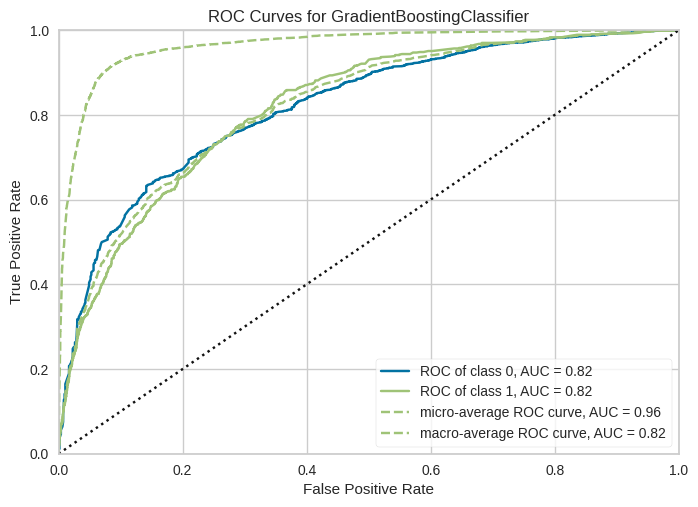

In [ ]:
plot_model(tuned_gbc, plot = 'auc')

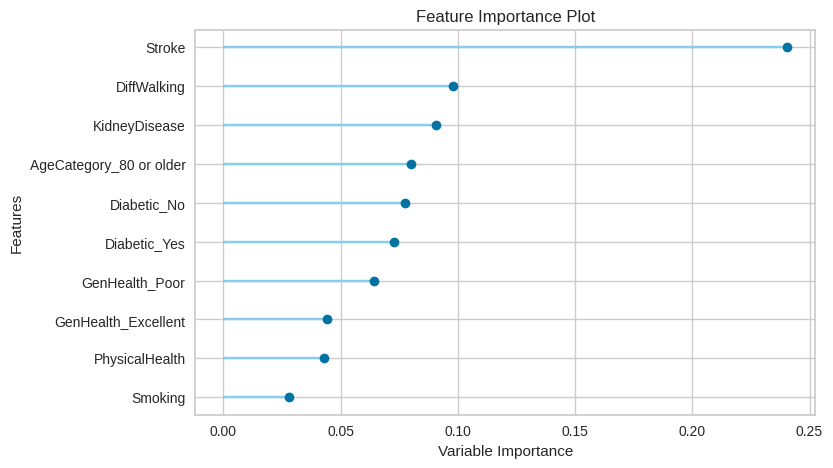

In [ ]:
plot_model(tuned_gbc, plot='feature')

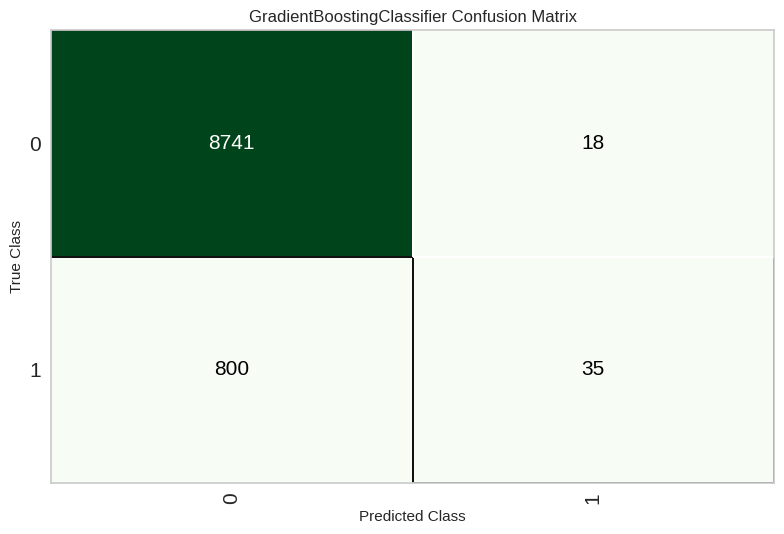

In [ ]:
plot_model(tuned_gbc, plot = 'confusion_matrix')

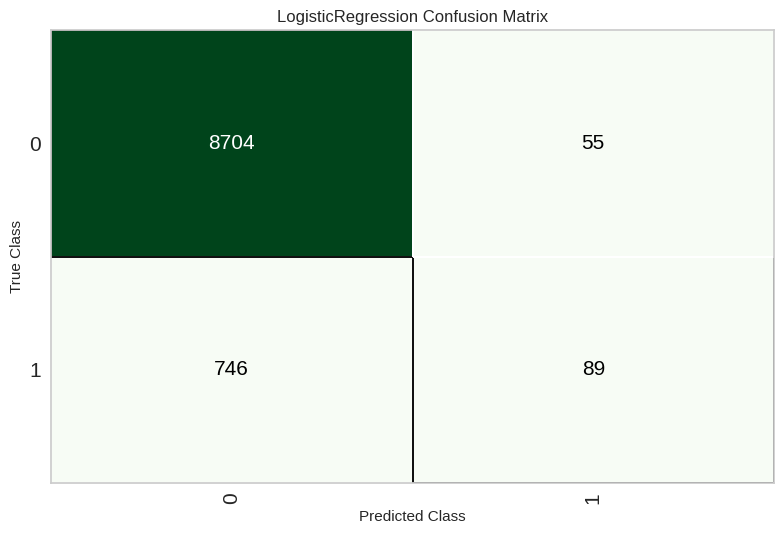

In [ ]:
plot_model(tuned_lr, plot = 'confusion_matrix')

**Проблема в том, что данные очень сильно несбалансированы, попробуем использовать модель с рнаибольшим показателем recall**

In [ ]:
nb = create_model('nb')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.6967,0.7961,0.7692,0.1913,0.3064,0.1940,0.2714
1,0.7128,0.8075,0.7538,0.1981,0.3138,0.2040,0.2772
2,0.7204,0.8362,0.8154,0.2123,0.3369,0.2305,0.3148
3,0.7115,0.7983,0.7436,0.1957,0.3098,0.1994,0.2709
4,0.7119,0.8143,0.7538,0.1976,0.3131,0.2031,0.2764
5,0.6900,0.8236,0.8256,0.1961,0.3169,0.2050,0.2942
6,0.6962,0.7972,0.7846,0.1934,0.3103,0.1983,0.2787
7,0.7020,0.7923,0.7692,0.1943,0.3102,0.1988,0.2758
8,0.7248,0.8138,0.7680,0.2069,0.3260,0.2194,0.2944


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
tuned_nb = tune_model(nb)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9129,0.6173,0.0000,0.0000,0.0000,0.0000,0.0000
1,0.9129,0.6360,0.0000,0.0000,0.0000,0.0000,0.0000
2,0.9129,0.6473,0.0000,0.0000,0.0000,0.0000,0.0000
3,0.9142,0.6114,0.0154,1.0000,0.0303,0.0277,0.1186
4,0.9125,0.6152,0.0000,0.0000,0.0000,-0.0009,-0.0065
5,0.9129,0.6497,0.0000,0.0000,0.0000,0.0000,0.0000
6,0.9124,0.6233,0.0000,0.0000,0.0000,-0.0009,-0.0065
7,0.9124,0.6393,0.0051,0.3333,0.0101,0.0075,0.0320
8,0.9124,0.5993,0.0000,0.0000,0.0000,-0.0018,-0.0092


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


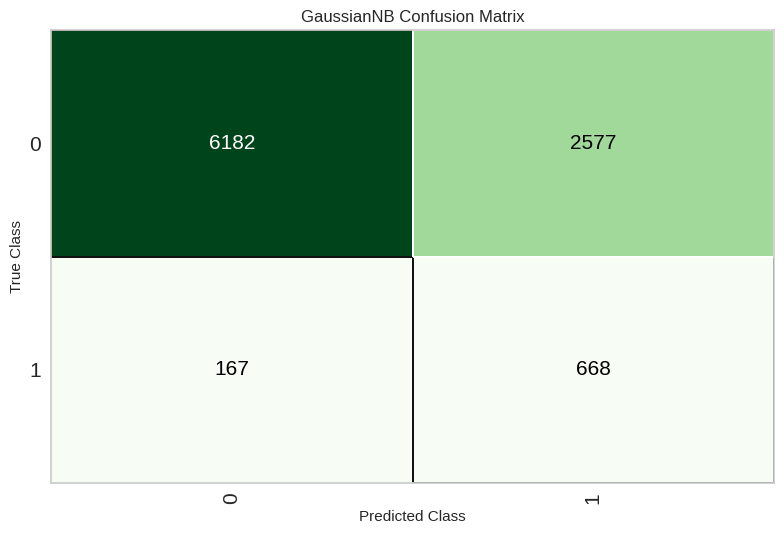

In [ ]:
plot_model(nb, plot = 'confusion_matrix')

**В данном случае мы получаем более верные предсказания по классу 1**

In [ ]:
final_gbc = finalize_model(tuned_gbc)

In [ ]:
final_nb = finalize_model(nb)

In [ ]:
predict_model(final_gbc)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9147,0.8206,0,0,0,0.0761,0.1567


,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease,prediction_label,prediction_score
7339,20.670000,No,No,No,0.0,0.0,No,Male,70-74,White,Yes,Yes,Very good,8.0,No,No,Yes,No,No,0.8643
21061,21.480000,No,No,No,0.0,7.0,No,Female,60-64,White,No,Yes,Excellent,7.0,No,No,Yes,No,No,0.9516
23283,23.299999,Yes,No,No,0.0,0.0,No,Female,70-74,White,Yes,Yes,Very good,8.0,No,No,No,No,No,0.8954
21060,19.389999,No,No,No,0.0,0.0,No,Male,70-74,White,No,Yes,Very good,8.0,No,No,No,No,No,0.9384
28748,24.799999,No,No,Yes,1.0,3.0,No,Female,70-74,White,No,No,Very good,7.0,No,No,No,No,No,0.8448
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2691,30.340000,No,No,No,0.0,0.0,No,Male,55-59,White,No,Yes,Excellent,8.0,No,No,No,No,No,0.9547
523,19.770000,No,No,No,0.0,0.0,No,Female,45-49,White,No,Yes,Excellent,8.0,No,No,No,No,No,0.9612
28137,31.620001,No,No,No,0.0,0.0,No,Female,25-29,White,No,Yes,Excellent,6.0,No,No,No,No,No,0.9662
10669,25.959999,No,No,No,0.0,0.0,No,Female,60-64,White,No,Yes,Excellent,8.0,No,No,No,No,No,0.9612


In [ ]:
unseen_predictions = predict_model(final_gbc, data=data_unseen)
unseen_predictions

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Gradient Boosting Classifier,0.9157,0.8152,0,0,0,0.0758,0.1493


,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,HeartDisease,prediction_label,prediction_score
0,16.600000,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes,No,No,0.8956
1,20.340000,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No,No,No,0.7857
2,26.580000,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No,No,No,0.8245
3,24.209999,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes,No,No,0.9167
4,23.709999,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No,No,No,0.9166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287810,22.219999,No,No,No,0.0,0.0,No,Female,18-24,Hispanic,No,Yes,Excellent,8.0,No,No,No,No,No,0.9643
287811,27.410000,Yes,No,No,7.0,0.0,Yes,Male,60-64,Hispanic,Yes,No,Fair,6.0,Yes,No,No,Yes,No,0.8324
287812,29.840000,Yes,No,No,0.0,0.0,No,Male,35-39,Hispanic,No,Yes,Very good,5.0,Yes,No,No,No,No,0.9501
287813,24.240000,No,No,No,0.0,0.0,No,Female,45-49,Hispanic,No,Yes,Good,6.0,No,No,No,No,No,0.9536


# AutoML H2O

In [ ]:
!pip install h2o
import h2o
from h2o.automl import H2OAutoML
h2o.init()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 7.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.40.0.2-py2.py3-none-any.whl size=177693439 sha256=bf68181b99fc04bdbde3d7304e46672f352ca54446ae229b92d6d8f3a12d5d03
  Stored in directory: /root/.cache/pip/wheels/b2/79/e3/842b81607eb31946ee24898cc9961b101e6486f988a5103967
Successfully built h2o
Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp20sz76qi
  JVM stdout: /tmp/tmp

H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.2
H2O_cluster_version_age:,"21 days, 15 hours and 15 minutes"
H2O_cluster_name:,H2O_from_python_unknownUser_wnmnua
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
h2o_df = h2o.H2OFrame(df)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
h2o_df

HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
No,16.6,Yes,No,No,3,30,No,Female,55-59,White,Yes,Yes,Very good,5,Yes,No,Yes
No,20.34,No,No,Yes,0,0,No,Female,80 or older,White,No,Yes,Very good,7,No,No,No
No,26.58,Yes,No,No,20,30,No,Male,65-69,White,Yes,Yes,Fair,8,Yes,No,No
No,24.21,No,No,No,0,0,No,Female,75-79,White,No,No,Good,6,No,No,Yes
No,23.71,No,No,No,28,0,Yes,Female,40-44,White,No,Yes,Very good,8,No,No,No
Yes,28.87,Yes,No,No,6,0,Yes,Female,75-79,Black,No,No,Fair,12,No,No,No
No,21.63,No,No,No,15,0,No,Female,70-74,White,No,Yes,Fair,4,Yes,No,Yes
No,31.64,Yes,No,No,5,0,Yes,Female,80 or older,White,Yes,No,Good,9,Yes,No,No
No,26.45,No,No,No,0,0,No,Female,80 or older,White,"No, borderline diabetes",No,Fair,5,No,Yes,No
No,40.69,No,No,No,0,0,Yes,Male,65-69,White,No,Yes,Good,10,No,No,No


In [ ]:
train, test = h2o_df.split_frame(ratios=[0.7], seed=1)

In [ ]:
y = 'HeartDisease'
x = h2o_df.columns
x.remove(y)

In [ ]:
train[y] = train[y].asfactor()
test[y] = test[y].asfactor()

In [ ]:
aml = H2OAutoML(balance_classes=True,max_runtime_secs = 60, seed = 1)
aml.train(x=x, y=y, training_frame=train, leaderboard_frame=test)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OXGBoostEstimator : XGBoost
Model Key: XGBoost_1_AutoML_1_20230331_63333


Model Summary: 
    number_of_trees
--  -----------------
    6

ModelMetricsBinomial: xgboost
** Reported on train data. **

MSE: 0.14376229518810726
RMSE: 0.3791599862697899
LogLoss: 0.44640466939227225
Mean Per-Class Error: 0.26556241812972664
AUC: 0.8827218583668589
AUCPR: 0.45519110119906664
Gini: 0.7654437167337178

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.6881346962595946
       No      Yes    Error    Rate
-----  ------  -----  -------  ------------------
No     132916  10565  0.0736   (10565.0/143481.0)
Yes    6113    7249   0.4575   (6113.0/13362.0)
Total  139029  17814  0.1063   (16678.0/156843.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.688135     0.465037  83
max f2                       0.542879     0.574852  146
max f0point5                 0.767592     0.476403  48
max accuracy                 0.815691     0.921928  29
max precision                0.900617     0.954955  2
max recall                   0.0736713    1         398
max specificity              0.910411     0.999979  0
max absolute_mcc             0.648259     0.412563  100
max min_per_class_accuracy   0.527716     0.798879  152
max mean_per_class_accuracy  0.483242     0.802172  171
max tns                      0.910411     143478    0
max fns                      0.910411     13335     0
max fps                      0.0594828    143481    399
max tps                      0.0736713    13362     398
max tnr                      0.910411     0.999979  0
max fnr                      0.910411     0.997979  0
max fpr                      0.0594828    1         399
max tpr                      0.0736713    1         398

Gains/Lift Table: Avg response rate:  8.52 %, avg score: 34.59 %
group    cumulative_data_fraction    lower_threshold    lift        cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  ----------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0100036                   0.854693           8.99987     8.99987            0.76673          0.874401   0.76673                     0.874401            0.0900314       0.0900314                  799.987   799.987            0.0874806
2        0.02002                     0.829483           6.73944     7.86894            0.574157         0.841696   0.670382                    0.858038            0.0675049       0.157536                   573.944   686.894            0.150323
3        0.0300045                   0.808946           5.89898     7.2134             0.502554         0.81893    0.614535                    0.845024            0.0588984       0.216435                   489.898   621.34             0.203792
4        0.0400018                   0.791435           5.47224     6.77825            0.466199         0.800009   0.577463                    0.833774            0.0547074       0.271142                   447.224   577.825            0.252666
5        0.0500054                   0.774864           4.69071     6.36063            0.399618         0.783094   0.541884                    0.823636            0.0469241       0.318066                   369.071   536.063            0.293025
6        0.100004                    0.703313           3.7076      5.0342             0.315863         0.738176   0.428881                    0.780908            0.185376        0.503443                   270.76    403.42             0.441009
7        0.150023                    0.641136       

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
XGBoost_1_AutoML_1_20230331_63333,0.826822,0.468183,0.316474,0.313636,0.391104,0.152962,24571,0.005866,XGBoost
GBM_1_AutoML_1_20230331_63333,0.786263,0.281056,0.283337,0.327448,0.277167,0.0768215,17551,0.008938,GBM
GLM_1_AutoML_1_20230331_63333,0.77475,0.282637,0.244721,0.318798,0.277328,0.0769108,14616,0.004575,GLM


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## XGBoost_1_AutoML_1_20230331_63333

,No,Yes,Error,Rate
No,79375.0,8189.0,0.0935,(8189.0/87564.0)
Yes,4412.0,3854.0,0.5338,(4412.0/8266.0)
Total,83787.0,12043.0,0.1315,(12601.0/95830.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

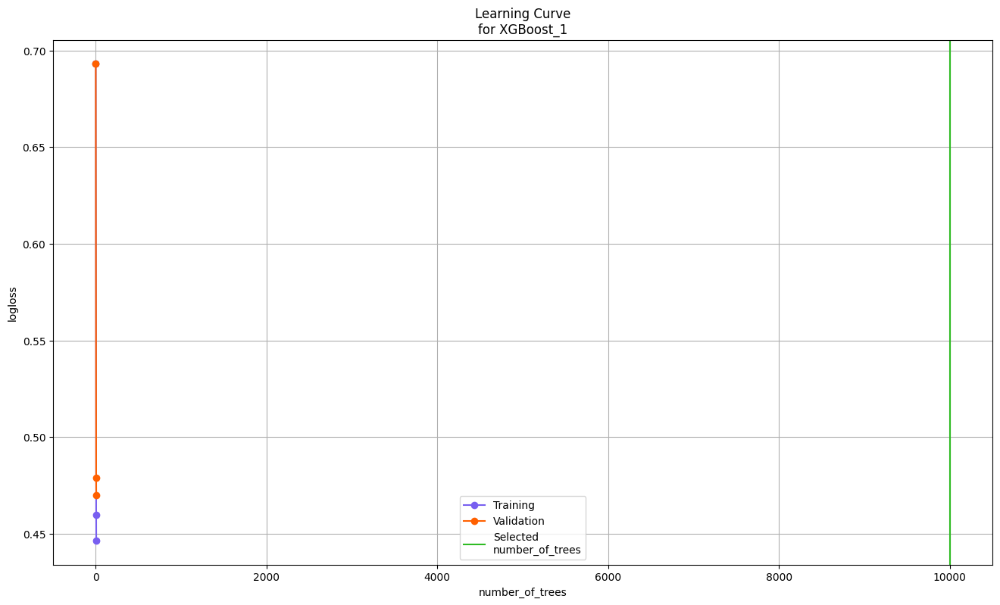

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

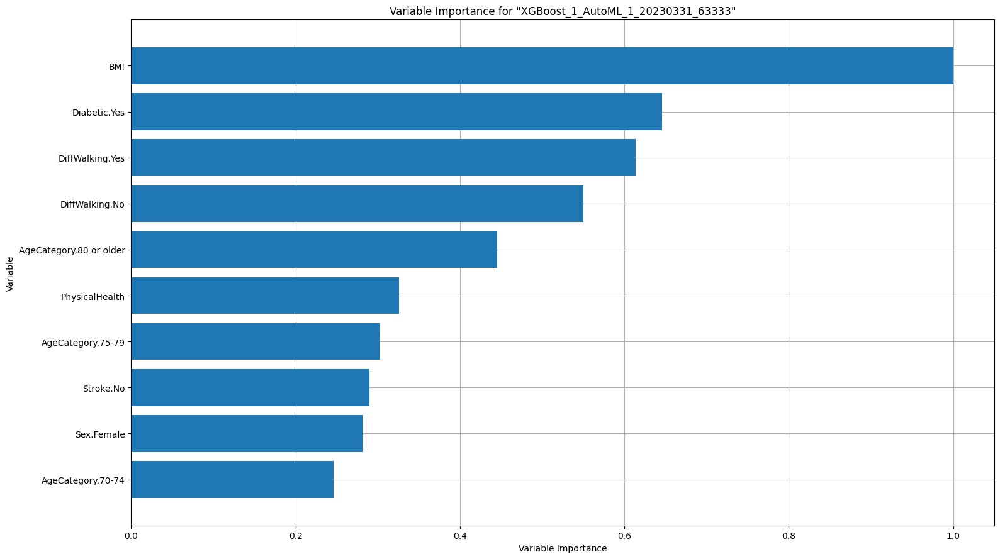

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

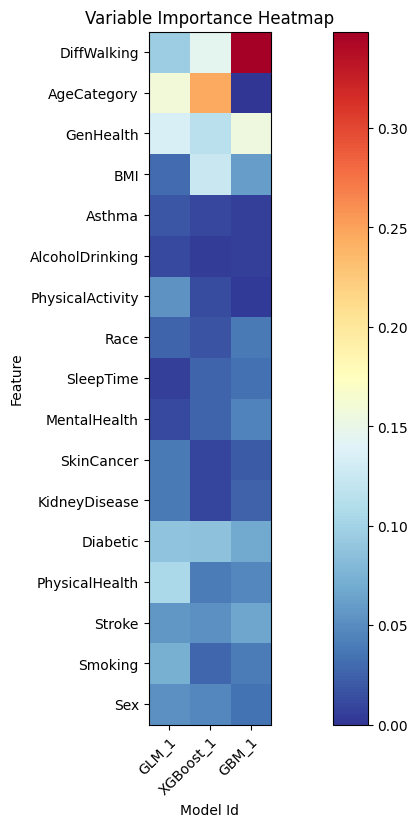

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

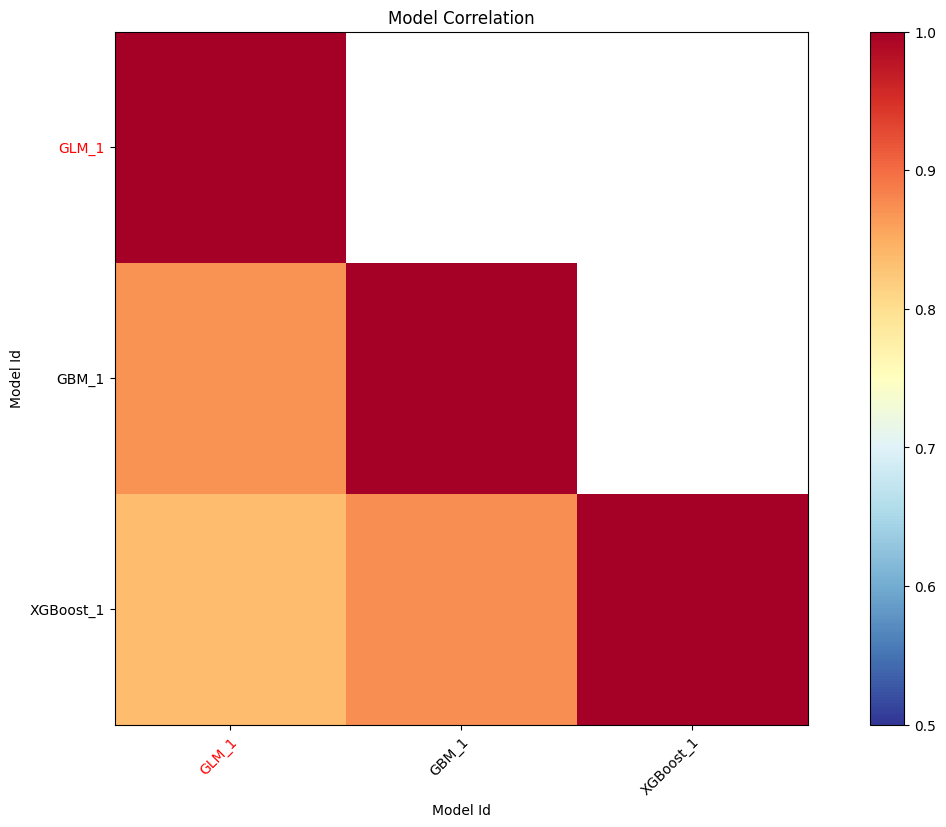

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

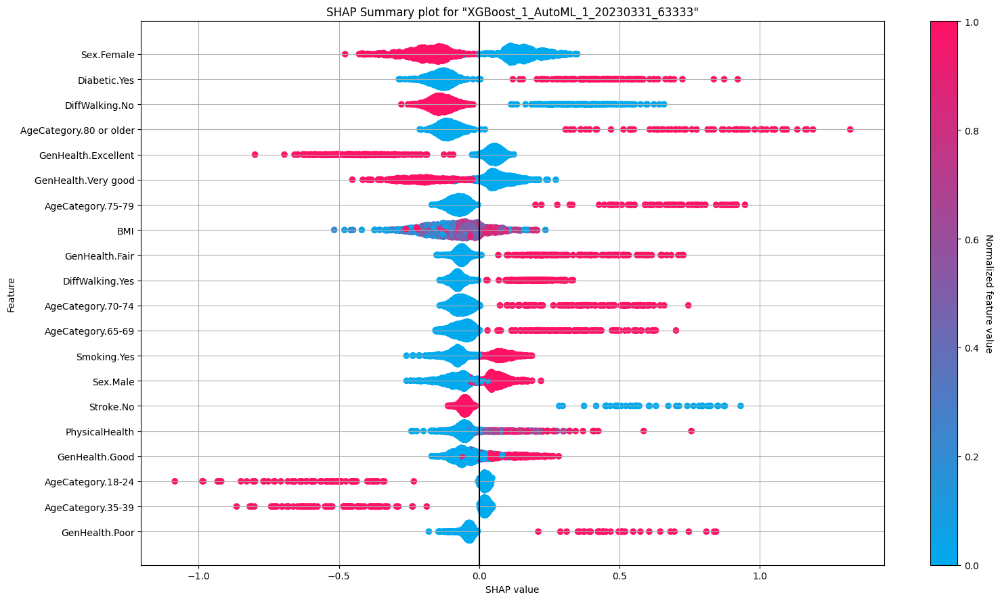

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

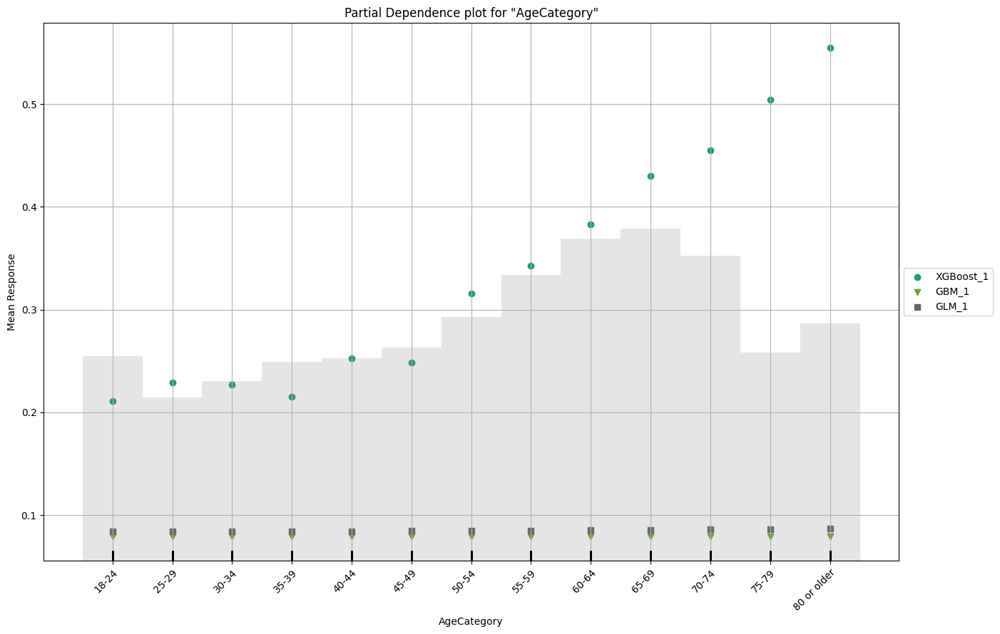

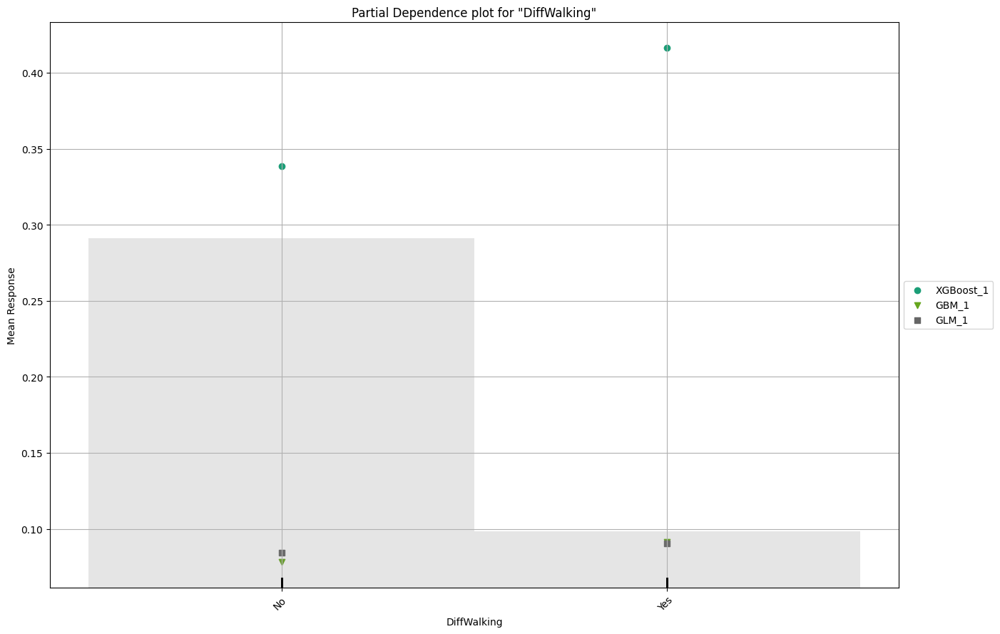

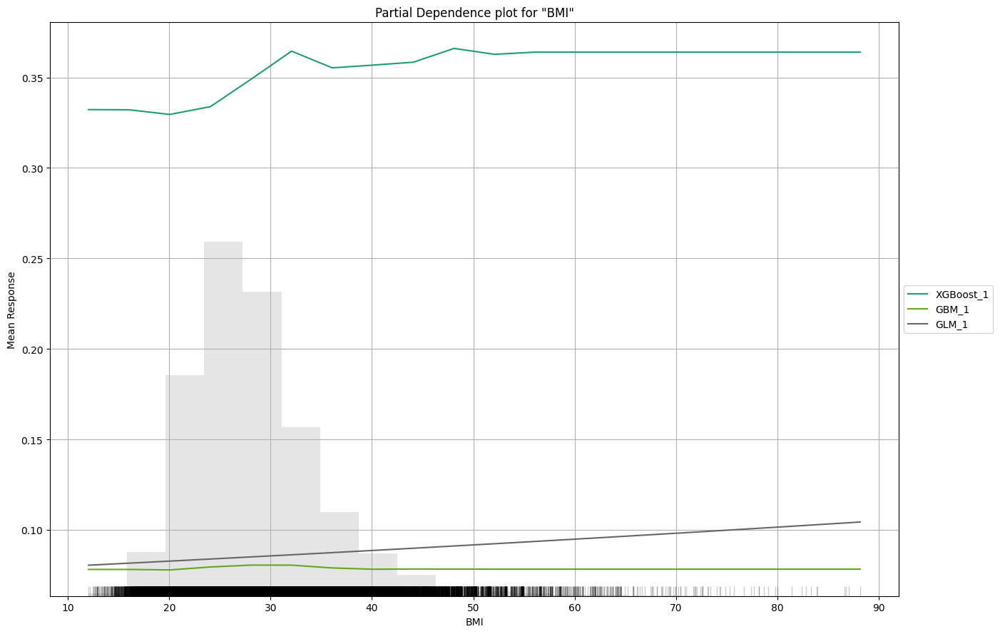

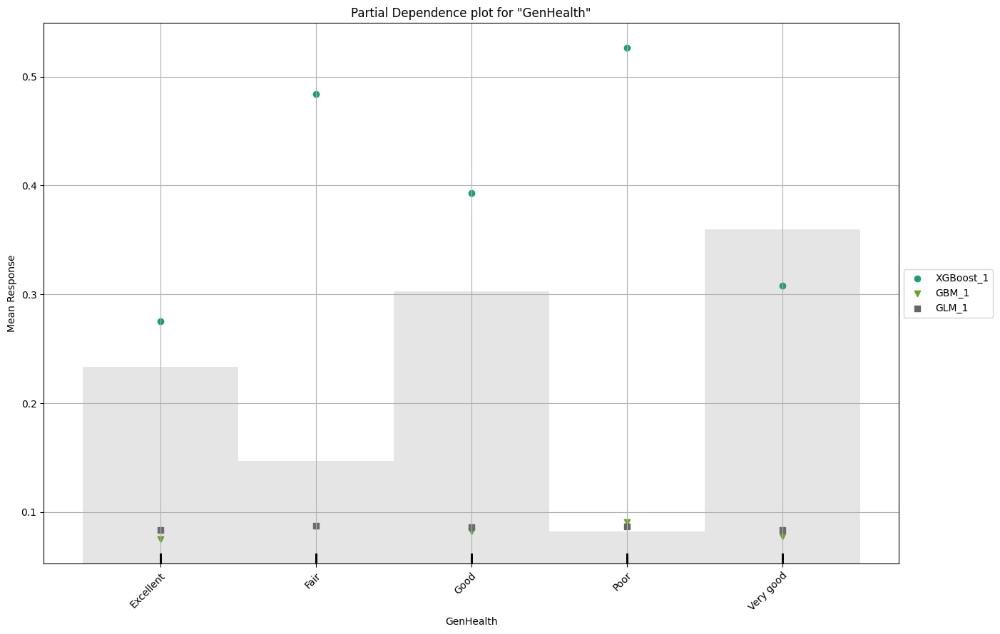

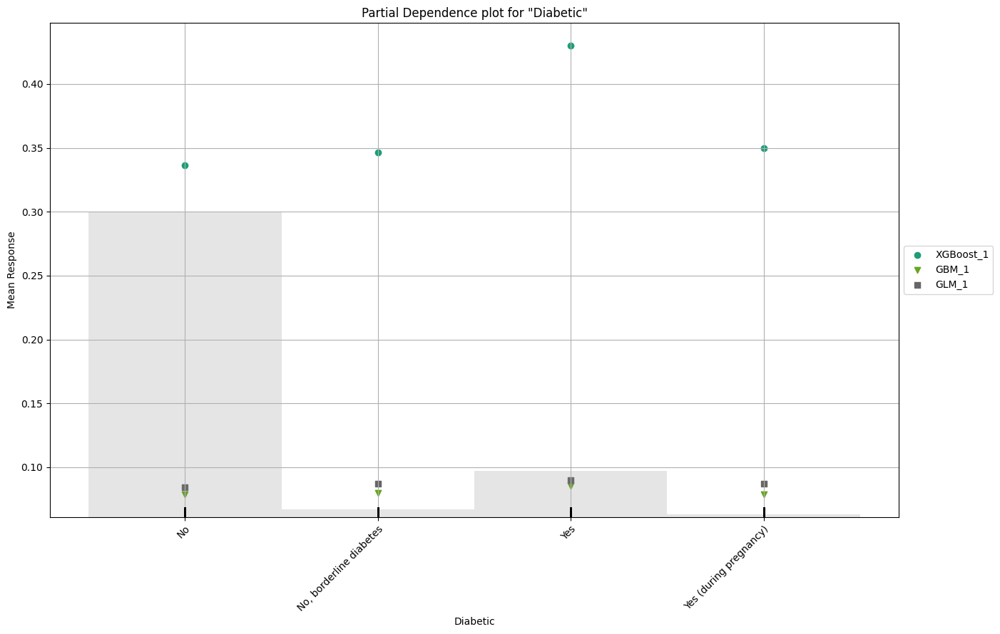

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse,training_time_ms,predict_time_per_row_ms,algo
XGBoost_1_AutoML_1_20230331_63333,0.826822,0.468183,0.316474,0.313636,0.391104,0.152962,24571,0.005866,XGBoost
GBM_1_AutoML_1_20230331_63333,0.786263,0.281056,0.283337,0.327448,0.277167,0.0768215,17551,0.008938,GBM
GLM_1_AutoML_1_20230331_63333,0.77475,0.282637,0.244721,0.318798,0.277328,0.0769108,14616,0.004575,GLM


# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## XGBoost_1_AutoML_1_20230331_63333

,No,Yes,Error,Rate
No,79375.0,8189.0,0.0935,(8189.0/87564.0)
Yes,4412.0,3854.0,0.5338,(4412.0/8266.0)
Total,83787.0,12043.0,0.1315,(12601.0/95830.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

In [ ]:
aml.explain(test)

In [ ]:
test_pred = aml.predict(test)

xgboost prediction progress: |███████████████████████████████████████████████████| (done) 100%


In [ ]:
predict = test_pred.as_data_frame()
predict

,predict,No,Yes
0,Yes,0.230723,0.769277
1,No,0.805887,0.194113
2,No,0.489805,0.510195
3,No,0.688930,0.311070
4,Yes,0.208017,0.791983
...,...,...,...
95825,No,0.892757,0.107243
95826,No,0.677493,0.322507
95827,No,0.861948,0.138052
95828,No,0.901698,0.098302


In [ ]:
test_predict = test.cbind(test_pred)

In [ ]:
test_predict.head(15)

HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer,predict,No,Yes
No,26.58,Yes,No,No,20,30,No,Male,65-69,White,Yes,Yes,Fair,8,Yes,No,No,Yes,0.230723,0.769277
No,23.71,No,No,No,28,0,Yes,Female,40-44,White,No,Yes,Very good,8,No,No,No,No,0.805887,0.194113
No,21.63,No,No,No,15,0,No,Female,70-74,White,No,Yes,Fair,4,Yes,No,Yes,No,0.489805,0.510195
No,40.69,No,No,No,0,0,Yes,Male,65-69,White,No,Yes,Good,10,No,No,No,No,0.68893,0.31107
Yes,34.3,Yes,No,No,30,0,Yes,Male,60-64,White,Yes,No,Poor,15,Yes,No,No,Yes,0.208017,0.791983
No,28.37,Yes,No,No,0,0,Yes,Male,75-79,White,Yes,Yes,Very good,8,No,No,No,Yes,0.276711,0.723289
No,21.16,No,No,No,0,0,No,Female,80 or older,Black,"No, borderline diabetes",No,Good,8,No,No,No,No,0.600439,0.399561
No,20.43,Yes,No,No,3,3,No,Female,65-69,White,No,Yes,Fair,5,Yes,No,Yes,Yes,0.267451,0.732549
No,21.93,No,No,No,3,2,No,Female,70-74,Black,No,Yes,Fair,4,No,Yes,No,No,0.462047,0.537953
No,31.09,No,No,No,2,0,No,Female,65-69,White,No,Yes,Very good,7,No,No,No,No,0.774454,0.225546


# Вывод

Наилучшие результаты показали модели логистической регрессии, градиентного бустинга (PyCaret) и XGBoost (h2o). Наиболее значимыми признаками  являются наличие инсульта, индекс массы тела, наличие диабета.

Для улучшения качества моделей требуется провести дополнительный EDA и Feature engineering, устранить высококоррелируемые фичи, нормализовать признаки с большим количеством уникальных значений, оценить проблему дисбаланса классов и др.